In [1]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import scipy.signal as scisig

In [2]:
folder_task = '/home/xingguang/Documents/ECE661/hw4/hw4_Task1_Images'
folder_result = '/home/xingguang/Documents/ECE661/hw4/Results'
path_1_1 = os.path.join(folder_task, 'pair1', '1.JPG')
path_1_2 = os.path.join(folder_task, 'pair1', '2.JPG')
path_2_1 = os.path.join(folder_task, 'pair2', '1.JPG')
path_2_2 = os.path.join(folder_task, 'pair2', '2.JPG')
path_3_1 = os.path.join(folder_task, 'pair3', '1.jpg')
path_3_2 = os.path.join(folder_task, 'pair3', '2.jpg')

img_1_1 = cv2.cvtColor(cv2.imread(path_1_1), cv2.COLOR_BGR2RGB)
img_1_2 = cv2.cvtColor(cv2.imread(path_1_2), cv2.COLOR_BGR2RGB)
img_2_1 = cv2.cvtColor(cv2.imread(path_2_1), cv2.COLOR_BGR2RGB)
img_2_2 = cv2.cvtColor(cv2.imread(path_2_2), cv2.COLOR_BGR2RGB)
img_3_1 = cv2.cvtColor(cv2.imread(path_3_1), cv2.COLOR_BGR2RGB)
img_3_2 = cv2.cvtColor(cv2.imread(path_3_2), cv2.COLOR_BGR2RGB)

g_1_1 = cv2.cvtColor(cv2.imread(path_1_1), cv2.COLOR_BGR2GRAY)
g_1_2 = cv2.cvtColor(cv2.imread(path_1_2), cv2.COLOR_BGR2GRAY)
g_2_1 = cv2.cvtColor(cv2.imread(path_2_1), cv2.COLOR_BGR2GRAY)
g_2_2 = cv2.cvtColor(cv2.imread(path_2_2), cv2.COLOR_BGR2GRAY)
g_3_1 = cv2.cvtColor(cv2.imread(path_3_1), cv2.COLOR_BGR2GRAY)
g_3_2 = cv2.cvtColor(cv2.imread(path_3_2), cv2.COLOR_BGR2GRAY)

In [3]:
def HarrisCornerDet(img, sigma, local=1, k=0.05, filter_ratio=0.1):
    def HaarFilter(sigma=1):
        s = round(np.ceil(4 * sigma))
        if s % 2: s += 1
        Fx = np.ones((s, s))
        Fx[:, :int(s/2)] = -1
        Fy = -1 * np.copy(Fx.T)
        return Fx, Fy

    h, w = img.shape
    Fx, Fy = HaarFilter(sigma)
    # Dx = cv2.filter2D(img,-1,Fx)
    # Dy = cv2.filter2D(img,-1,Dx)
    Dx = scisig.correlate2d(img, Fx, mode="same")
    Dy = scisig.correlate2d(img, Fy, mode="same")
    Dx2 = Dx * Dx
    Dxy = Dx * Dy
    Dy2 = Dy * Dy
    sumSize = int(round(np.ceil(5*sigma)/2.0)*2+1)
    sumFilter = np.ones((sumSize, sumSize))
    # Dx2 = cv2.filter2D(Dx2,-1,sumFilter)
    # Dxy = cv2.filter2D(Dxy,-1,sumFilter)
    # Dy2 = cv2.filter2D(Dy2,-1,sumFilter)
    Dx2 = scisig.correlate2d(Dx2, sumFilter, mode='same')
    Dxy = scisig.correlate2d(Dxy, sumFilter, mode='same')
    Dy2 = scisig.correlate2d(Dy2, sumFilter, mode='same')
    detC = Dx2 * Dy2 - Dxy * Dxy
    trC = Dx2 + Dy2
    R = detC - k * trC * trC
    thresh = filter_ratio * R.max()
    markerImg = np.zeros_like(R)
    for i in range(local, h-local):
        for j in range(local, w-local):
            neighbor = R[i-local:i+local+1, j-local:j+local+1]
            if R[i, j] == np.amax(neighbor) and R[i, j] >= 0:
                markerImg[i, j] = R[i, j]

    i, j = np.where(markerImg >= thresh) 
    pList = [_ for _ in zip(j, i)]
    return markerImg, pList


def DrawMarker(Img, pList, color=(0,0,255)):
    result = np.copy(Img)
    for j, i in pList:
        result = cv2.circle(result, (j, i), 5, color, 1)
    return result

In [4]:
def HarrisFeatureMaking(img, pList, window_size):
    ws = window_size
    feature = np.zeros((len(pList), (2*ws+1)*(2*ws+1)))
    new_img = cv2.copyMakeBorder(img, ws, ws, ws, ws, cv2.BORDER_REPLICATE)
    for k , (j, i) in enumerate(pList):
        i, j = i+ws, j+ws
        neighbors = new_img[i-ws:i+ws+1, j-ws:j+ws+1]
        feature[k, :] = neighbors.reshape((1, -1))
    return feature


def cpMatching(f1, f2, method):
    d1 = f1.shape[0]
    d2 = f2.shape[0]
    if method == 'SSD':
        f11 = np.sum(f1*f1, axis=1).reshape((d1, 1))
        f12 = np.matmul(f1, f2.T)
        f22 = np.sum(f2*f2, axis=1).reshape((1, d2))
        cp = -f11.repeat(d2, axis=1) + 2 * f12 - f22.repeat(d1, axis=0)
    elif method == 'NCC':
        m1 = np.sum(f1, axis=1, keepdims=True)/f1.shape[1]
        m2 = np.sum(f2, axis=1, keepdims=True)/f2.shape[1]
        nf1 = f1 - m1
        nf2 = f2 - m2
        numerator = np.matmul(nf1, nf2.T)
        denom_1 = np.sqrt(np.sum(nf1*nf1, axis=1).reshape((d1, 1)))
        denom_2 = np.sqrt(np.sum(nf2*nf2, axis=1).reshape((1, d2)))
        denominator = np.matmul(denom_1, denom_2)
        cp = numerator / denominator
    else: print("\'Method\' has to be SSD or NCC")
    f1_Matching = np.argmax(cp, axis=1)
    f2_Matching = np.argmax(cp, axis=0)
    return cp, f1_Matching, f2_Matching


def matchedImg(img1, img2, pList1, pList2, f1_f2, f2_f1):
    def drawLines(img, p_start, p_end, color=(0,255,0)):
        image = np.copy(img)
        for i in range(len(p_start)):
            image = cv2.circle(image, p_start[i], 5, color, 1)
            image = cv2.circle(image, p_end[i], 5, color, 1)
            image = cv2.line(image, p_start[i], p_end[i], color, 2) 
        return image

    im1 = np.copy(img1)
    im2 = np.copy(img2)

    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    if h1 > h2:
        im2 = cv2.copyMakeBorder(im2, 0, h1-h2, 0, 0, cv2.BORDER_REPLICATE)
        h = h1
    elif h1 < h2:
        im1 = cv2.copyMakeBorder(im1, 0, h2-h1, 0, 0, cv2.BORDER_REPLICATE)
        h = h2
    else: h = h1

    if w1 > w2:
        im2 = cv2.copyMakeBorder(im2, 0, 0, 0, w1-w2, cv2.BORDER_REPLICATE)
        w = w1
    elif w1 < w2:
        im1 = cv2.copyMakeBorder(im1, 0, 0, 0, w2-w1, cv2.BORDER_REPLICATE)
        w = w2
    else: w = w1

    concatIm = np.concatenate((im1, im2), axis=1)
    npList2 = [(j+w, i) for (j, i) in pList2]
    concatIm = DrawMarker(concatIm, pList1, color=(255,0,0))
    concatIm = DrawMarker(concatIm, npList2, color=(255,0,0))

    bestMatch_1 = []
    bestMatch_2 = []
    for i, idx2 in enumerate(f1_f2):
        if i == f2_f1[idx2]:
            bestMatch_1.append(pList1[i])
            bestMatch_2.append(npList2[idx2])
    print('detected '+str(len(pList1))+ ' corners in image 1')
    print('detected '+str(len(pList2))+ ' corners in image 2')
    print('found '+str(len(bestMatch_1))+ ' matched corners between image 1 and 2')
    matchedIm = drawLines(concatIm, bestMatch_1, bestMatch_2, color=(0,255,0))
    return concatIm, matchedIm

detected 103 corners in image 1
detected 92 corners in image 2
found 47 matched corners between image 1 and 2


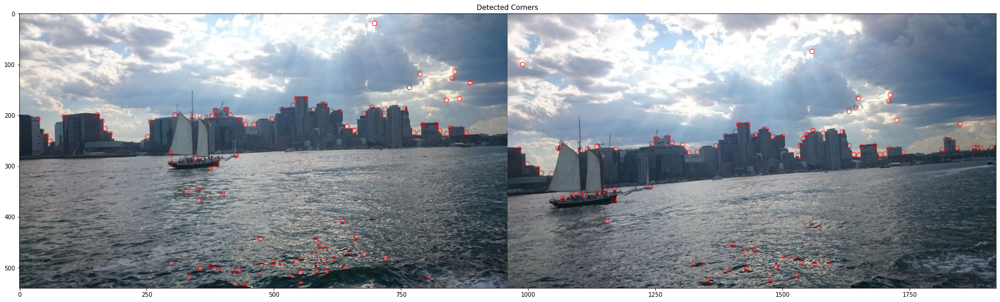

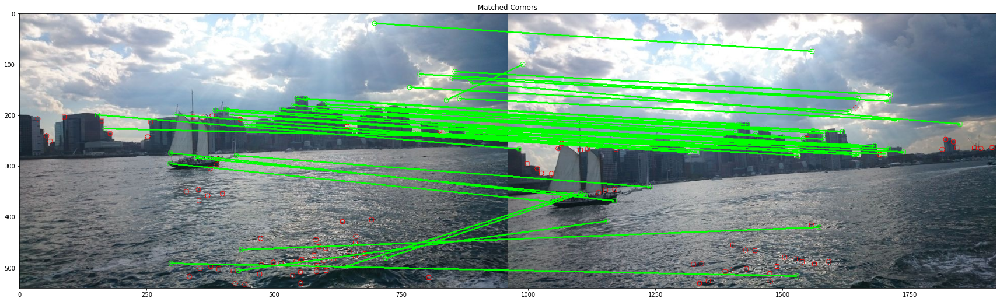

In [5]:
markerImg, responses_1 = HarrisCornerDet(g_1_1, sigma=2 , local=7, k=0.05, filter_ratio=0.02)
markerImg, responses_2 = HarrisCornerDet(g_1_2, sigma=2 , local=7, k=0.05, filter_ratio=0.02)
f1 = HarrisFeatureMaking(g_1_1, pList=responses_1, window_size=20)
f2 = HarrisFeatureMaking(g_1_2, pList=responses_2, window_size=20)
cp, f1_f2, f2_f1 = cpMatching(f1, f2, method='SSD')
concatIm, matchedIm = matchedImg(img_1_1, img_1_2, responses_1, responses_2, f1_f2, f2_f1)
plt.figure(figsize=(30,60))
plt.title('Detected Corners')
plt.imshow(concatIm)

plt.figure(figsize=(30,60))
plt.title('Matched Corners')
plt.imshow(matchedIm)

detected 743 corners in image 1
detected 750 corners in image 2
found 293 matched corners between image 1 and 2


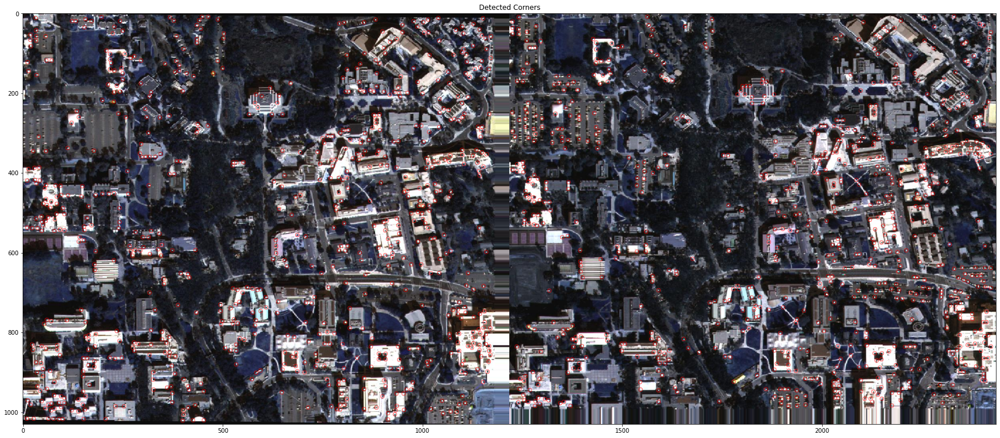

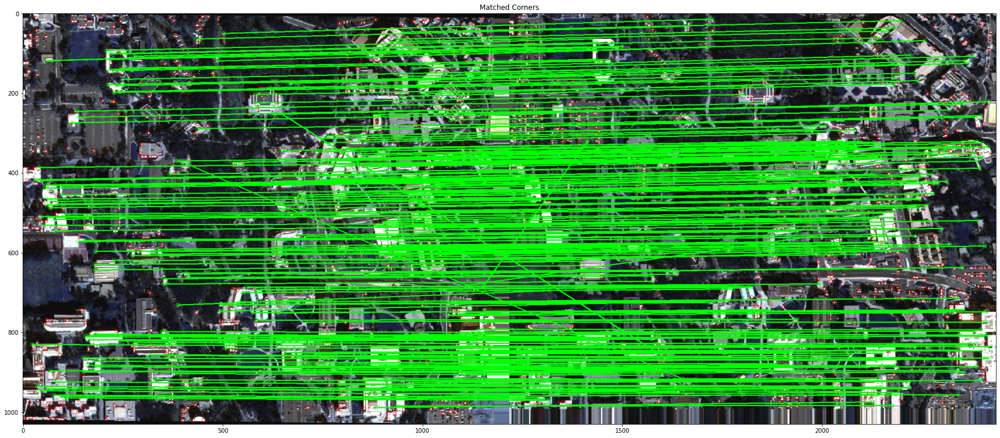

In [6]:
markerImg, responses_1 = HarrisCornerDet(g_2_1, sigma=0.7 , local=7, k=0.05, filter_ratio=0.1)
markerImg, responses_2 = HarrisCornerDet(g_2_2, sigma=0.7 , local=7, k=0.05, filter_ratio=0.1)
f1 = HarrisFeatureMaking(g_2_1, pList=responses_1, window_size=40)
f2 = HarrisFeatureMaking(g_2_2, pList=responses_2, window_size=40)
cp, f1_f2, f2_f1 = cpMatching(f1, f2, method='SSD')
concatIm, matchedIm = matchedImg(img_2_1, img_2_2, responses_1, responses_2, f1_f2, f2_f1)
plt.figure(figsize=(30,60))
plt.title('Detected Corners')
plt.imshow(concatIm)

plt.figure(figsize=(30,60))
plt.title('Matched Corners')
plt.imshow(matchedIm)

In [7]:
markerImg, responses_1 = HarrisCornerDet(g_3_1, sigma=0.7 , local=7, k=0.05, filter_ratio=0.02)
markerImg, responses_2 = HarrisCornerDet(g_3_2, sigma=0.7 , local=7, k=0.05, filter_ratio=0.02)
f1 = HarrisFeatureMaking(g_3_1, pList=responses_1, window_size=20)
f2 = HarrisFeatureMaking(g_3_2, pList=responses_2, window_size=20)
cp, f1_f2, f2_f1 = cpMatching(f1, f2, method='SSD')
concatIm, matchedIm = matchedImg(img_3_1, img_3_2, responses_1, responses_2, f1_f2, f2_f1)
plt.figure(figsize=(30,60))
plt.title('Detected Corners')
plt.imshow(concatIm)

plt.figure(figsize=(30,60))
plt.title('Matched Corners')
plt.imshow(matchedIm)

In [8]:
sift = cv2.xfeatures2d.SIFT_create(nfeatures=300) # Initiate sift detector.
kp1, des1 = sift.detectAndCompute(g_1_1, None)
kp2, des2 = sift.detectAndCompute(g_1_2, None)
pList1 = [(int(kp1[i].pt[0]), int(kp1[i].pt[1])) for i in range(len(kp1))]
pList2 = [(int(kp2[i].pt[0]), int(kp2[i].pt[1])) for i in range(len(kp2))]
cp, f1_f2, f2_f1 = cpMatching(des1, des2, method='NCC')
concatIm, matchedIm = matchedImg(img_1_1, img_1_2, pList1, pList2, f1_f2, f2_f1)
plt.figure(figsize=(30,60))
plt.title('Detected Corners')
plt.imshow(concatIm)

plt.figure(figsize=(30,60))
plt.title('Matched Corners')
plt.imshow(matchedIm)

In [9]:
surf = cv2.xfeatures2d.SURF_create(hessianThreshold=7500) # Initiate sift detector.
kp1, des1 = surf.detectAndCompute(g_3_1, None)
kp2, des2 = surf.detectAndCompute(g_3_2, None)
pList1 = [(int(kp1[i].pt[0]), int(kp1[i].pt[1])) for i in range(len(kp1))]
pList2 = [(int(kp2[i].pt[0]), int(kp2[i].pt[1])) for i in range(len(kp2))]
cp, f1_f2, f2_f1 = cpMatching(des1, des2, method='NCC')
concatIm, matchedIm = matchedImg(img_3_1, img_3_2, pList1, pList2, f1_f2, f2_f1)
plt.figure(figsize=(30,60))
plt.title('Detected Corners')
plt.imshow(concatIm)

plt.figure(figsize=(30,60))
plt.title('Matched Corners')
plt.imshow(matchedIm)

In [10]:
folder_task = '/home/xingguang/Documents/ECE661/hw4/hw4_Task2_Images'
path_1_1 = os.path.join(folder_task, 'pair1', '1.jpg')
path_1_2 = os.path.join(folder_task, 'pair1', '2.jpg')
path_2_1 = os.path.join(folder_task, 'pair2', '1.jpg')
path_2_2 = os.path.join(folder_task, 'pair2', '2.jpg')

img_1_1 = cv2.cvtColor(cv2.imread(path_1_1), cv2.COLOR_BGR2RGB)
img_1_2 = cv2.cvtColor(cv2.imread(path_1_2), cv2.COLOR_BGR2RGB)
img_2_1 = cv2.cvtColor(cv2.imread(path_2_1), cv2.COLOR_BGR2RGB)
img_2_2 = cv2.cvtColor(cv2.imread(path_2_2), cv2.COLOR_BGR2RGB)

g_1_1 = cv2.cvtColor(cv2.imread(path_1_1), cv2.COLOR_BGR2GRAY)
g_1_2 = cv2.cvtColor(cv2.imread(path_1_2), cv2.COLOR_BGR2GRAY)
g_2_1 = cv2.cvtColor(cv2.imread(path_2_1), cv2.COLOR_BGR2GRAY)
g_2_2 = cv2.cvtColor(cv2.imread(path_2_2), cv2.COLOR_BGR2GRAY)

In [11]:
markerImg, responses_1 = HarrisCornerDet(g_2_1, sigma=0.7, local=7, k=0.05, filter_ratio=0.01)
markerImg, responses_2 = HarrisCornerDet(g_2_2, sigma=0.7, local=7, k=0.05, filter_ratio=0.01)
f1 = HarrisFeatureMaking(g_2_1, pList=responses_1, window_size=20)
f2 = HarrisFeatureMaking(g_2_2, pList=responses_2, window_size=20)
cp, f1_f2, f2_f1 = cpMatching(f1, f2, method='SSD')
concatIm, matchedIm = matchedImg(img_2_1, img_2_2, responses_1, responses_2, f1_f2, f2_f1)
plt.figure(figsize=(30,60))
plt.title('Detected Corners')
plt.imshow(concatIm)

plt.figure(figsize=(30,60))
plt.title('Matched Corners')
plt.imshow(matchedIm)

In [12]:
sift = cv2.xfeatures2d.SIFT_create(nfeatures=300) # Initiate sift detector.
kp1, des1 = sift.detectAndCompute(g_2_1, None)
kp2, des2 = sift.detectAndCompute(g_2_2, None)
pList1 = [(int(kp1[i].pt[0]), int(kp1[i].pt[1])) for i in range(len(kp1))]
pList2 = [(int(kp2[i].pt[0]), int(kp2[i].pt[1])) for i in range(len(kp2))]
cp, f1_f2, f2_f1 = cpMatching(des1, des2, method='NCC')
concatIm, matchedIm = matchedImg(img_2_1, img_2_2, pList1, pList2, f1_f2, f2_f1)
plt.figure(figsize=(30,60))
plt.title('Detected Corners')
plt.imshow(concatIm)

plt.figure(figsize=(30,60))
plt.title('Matched Corners')
plt.imshow(matchedIm)

In [13]:
surf = cv2.xfeatures2d.SURF_create(hessianThreshold=15000) # Initiate sift detector.
kp1, des1 = surf.detectAndCompute(g_1_1, None)
kp2, des2 = surf.detectAndCompute(g_1_2, None)
pList1 = [(int(kp1[i].pt[0]), int(kp1[i].pt[1])) for i in range(len(kp1))]
pList2 = [(int(kp2[i].pt[0]), int(kp2[i].pt[1])) for i in range(len(kp2))]
cp, f1_f2, f2_f1 = cpMatching(des1, des2, method='NCC')
concatIm, matchedIm = matchedImg(img_1_1, img_1_2, pList1, pList2, f1_f2, f2_f1)
plt.figure(figsize=(30,60))
plt.title('Detected Corners')
plt.imshow(concatIm)

plt.figure(figsize=(30,60))
plt.title('Matched Corners')
plt.imshow(matchedIm)